# Expanded Digital Twin: LDHA Inhibition 

This notebook integrates real LDHA inhibitor data + docking results for a full digital twin simulation.

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from rdkit import Chem
from rdkit.Chem import AllChem
import shap

## 1. Load Real Dataset

In [22]:
df = pd.read_csv('LDHA_inhibitors_deduplicated.csv')
df.head()

,Ligand SMILES,IC50 (nM),class
0,C#CCCCC(=O)Nc1ccc(C(=O)c2ccc(NCc3ccc(-c4ccc(O)...,500.0,1
1,C#CCN(Cc1ccc(-c2ccc(O)c(C(=O)O)c2)o1)Cc1ccc(-c...,1600.0,0
2,C#CCNCc1ccc(-c2ccc(O)c(C(=O)O)c2)o1.N,2000.0,0
3,C#Cc1cc(-c2nn(-c3nc(C(=O)O)cs3)c(CC3CC3)c2Cc2c...,456.0,1
4,C/C=C/c1cc(-c2nn(-c3nc(C(=O)O)cs3)c(CC3CC3)c2C...,215.8,1


## 2. Extract Molecular Fingerprints

In [25]:
import warnings
from rdkit import RDLogger

# Suppress RDKit deprecation warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Suppress RDKit logs
RDLogger.DisableLog('rdApp.*')

fps = []
for smi in df['Ligand SMILES']:
    mol = Chem.MolFromSmiles(smi)
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048)
    arr = np.zeros((1,))
    AllChem.DataStructs.ConvertToNumpyArray(fp, arr)
    fps.append(arr)
X = np.array(fps)
y = df['class']

## 3. Train ML Model

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
print('Train Score:', clf.score(X_train, y_train))
print('Test Score:', clf.score(X_test, y_test))

Train Score: 0.9722222222222222
Test Score: 0.8929889298892989


## 4. Load Docking Results & Merge

Cleaned data preview:
                                       Ligand_SMILES  IC50_nM  Class  \
0  C#CCCCC(=O)Nc1ccc(C(=O)c2ccc(NCc3ccc(-c4ccc(O)...    500.0      1   
1  C#CCN(Cc1ccc(-c2ccc(O)c(C(=O)O)c2)o1)Cc1ccc(-c...   1600.0      0   
2              C#CCNCc1ccc(-c2ccc(O)c(C(=O)O)c2)o1.N   2000.0      0   
3  C#Cc1cc(-c2nn(-c3nc(C(=O)O)cs3)c(CC3CC3)c2Cc2c...    456.0      1   
4  C/C=C/c1cc(-c2nn(-c3nc(C(=O)O)cs3)c(CC3CC3)c2C...    215.8      1   

  Compound_ID  Docking_Score  
0    CMPD_000     -11.751243  
1    CMPD_001     -12.067852  
2    CMPD_002     -11.674556  
3    CMPD_003     -11.238120  
4    CMPD_004     -12.116904  


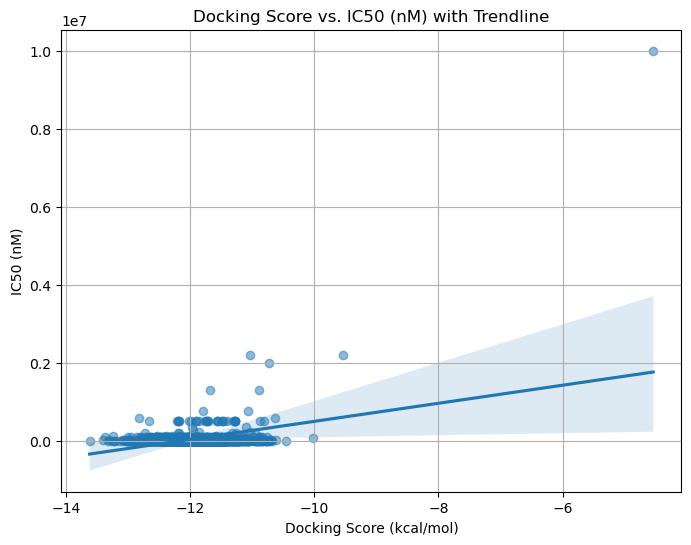

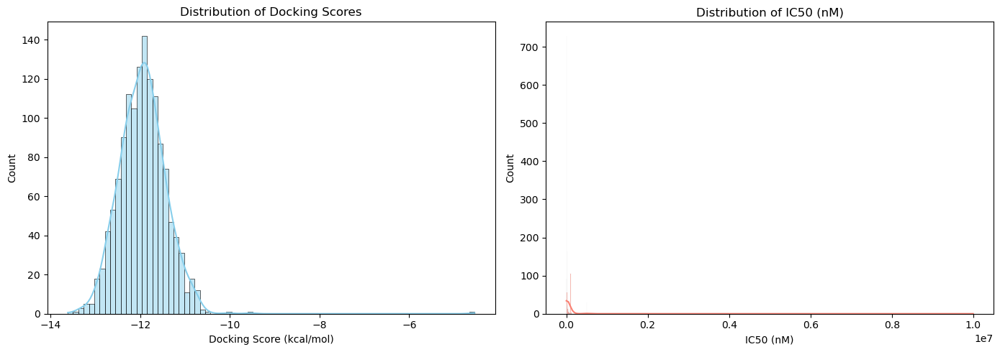

/var/folders/qh/fmzc9db1783cz_z1bj3znn44y1tlxj/T/ipykernel_71993/2891743033.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Class', y='Docking_Score', palette='Set2')


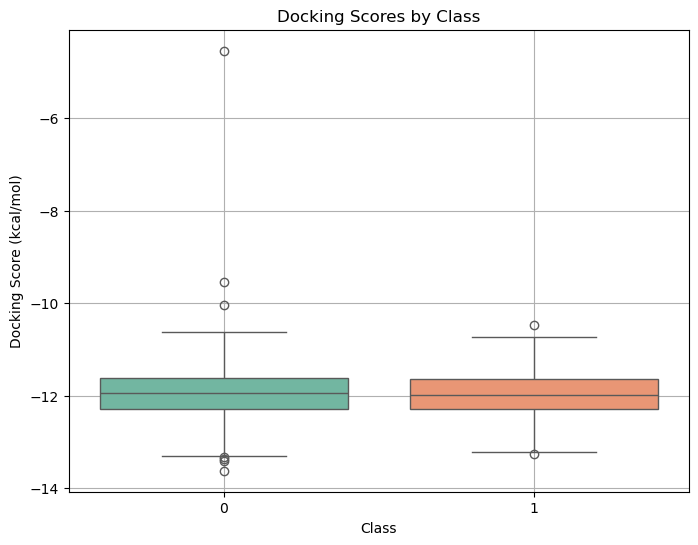


Correlation Analysis:
Pearson correlation (linear): 0.410
Spearman correlation (monotonic): 0.058


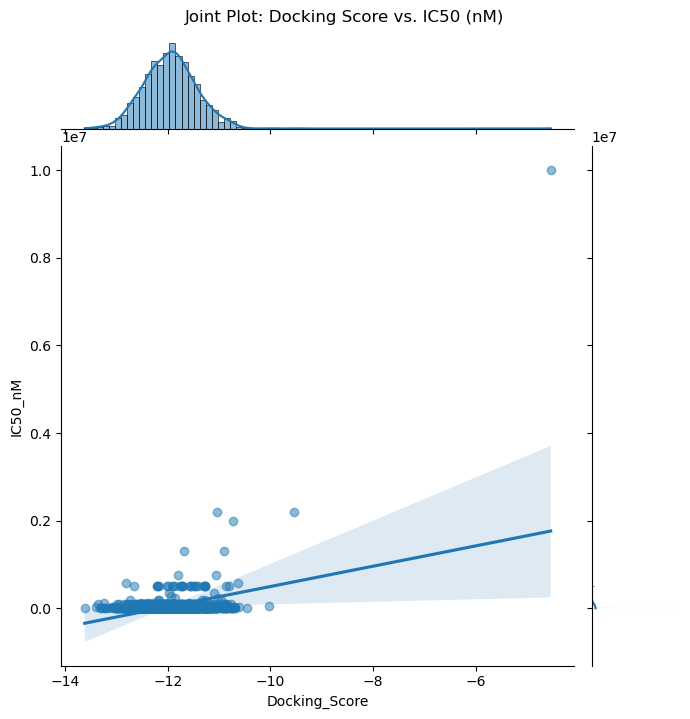

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Load your cleaned data
df = pd.read_csv('cleaned_merged_dataset.csv')

# Quick preview
print("Cleaned data preview:")
print(df.head())

# 2. Scatterplot with trendline
plt.figure(figsize=(8,6))
sns.regplot(data=df, x='Docking_Score', y='IC50_nM', scatter_kws={'alpha':0.5})
plt.title('Docking Score vs. IC50 (nM) with Trendline')
plt.xlabel('Docking Score (kcal/mol)')
plt.ylabel('IC50 (nM)')
plt.grid(True)
plt.show()

# 3. Distribution plots
fig, axes = plt.subplots(1, 2, figsize=(14,5))

# Docking Score distribution
sns.histplot(df['Docking_Score'], kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Distribution of Docking Scores')
axes[0].set_xlabel('Docking Score (kcal/mol)')

# IC50 distribution
sns.histplot(df['IC50_nM'], kde=True, ax=axes[1], color='salmon')
axes[1].set_title('Distribution of IC50 (nM)')
axes[1].set_xlabel('IC50 (nM)')

plt.tight_layout()
plt.show()

# 4. Boxplot of Docking Scores by Class
plt.figure(figsize=(8,6))
sns.boxplot(data=df, x='Class', y='Docking_Score', palette='Set2')
plt.title('Docking Scores by Class')
plt.xlabel('Class')
plt.ylabel('Docking Score (kcal/mol)')
plt.grid(True)
plt.show()

# 5. Correlation analysis
pearson_corr = df[['Docking_Score', 'IC50_nM']].corr(method='pearson').iloc[0,1]
spearman_corr = df[['Docking_Score', 'IC50_nM']].corr(method='spearman').iloc[0,1]

print('\nCorrelation Analysis:')
print(f'Pearson correlation (linear): {pearson_corr:.3f}')
print(f'Spearman correlation (monotonic): {spearman_corr:.3f}')

# 6. Joint plot (scatter + density)
sns.jointplot(data=df, x='Docking_Score', y='IC50_nM', kind='reg', height=7, scatter_kws={'alpha':0.5})
plt.suptitle('Joint Plot: Docking Score vs. IC50 (nM)', y=1.02)
plt.show()

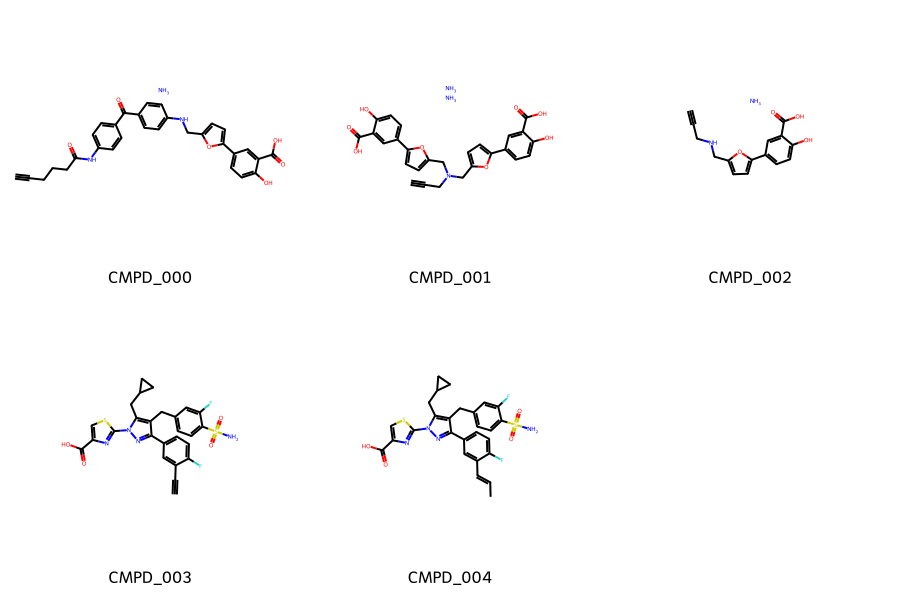

In [35]:
from rdkit import Chem
from rdkit.Chem import Draw

# Load cleaned dataset
df = pd.read_csv('cleaned_merged_dataset.csv')

# Pick a few compounds to visualize (e.g., first 5)
smiles_list = df['Ligand_SMILES'].head(5).tolist()
compound_ids = df['Compound_ID'].head(5).tolist()

# Convert SMILES to RDKit Molecule objects
mols = [Chem.MolFromSmiles(smiles) for smiles in smiles_list]

# Draw molecules in a grid
img = Draw.MolsToGridImage(mols, molsPerRow=3, legends=compound_ids, subImgSize=(300,300))
img

In [39]:
import requests

# URL for PDB file (LDHA, PDB ID: 1I10)
url = 'https://files.rcsb.org/download/1I10.pdb'

# Download the PDB content
response = requests.get(url)

# Save to a local file
with open('ldha.pdb', 'w') as f:
    f.write(response.text)

print('LDHA PDB file saved as ldha.pdb')

LDHA PDB file saved as ldha.pdb


In [41]:
import os
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
import requests
import py3Dmol

# 1. Setup paths
input_csv = 'cleaned_merged_dataset.csv'  # Your dataset
output_dir = 'best_ligand_prepared'  # Folder to save best ligand
os.makedirs(output_dir, exist_ok=True)

# 2. Load your dataset
df = pd.read_csv(input_csv)

# 3. Find the best (lowest) IC50 ligand
best_row = df.loc[df['IC50_nM'].idxmin()]
compound_id = best_row['Compound_ID']
smiles = best_row['Ligand_SMILES']
ic50_value = best_row['IC50_nM']

print(f'Best ligand found: {compound_id} with IC50 = {ic50_value} nM')

# 4. Prepare the best ligand (generate 3D conformer)
try:
    mol = Chem.MolFromSmiles(smiles)
    mol = Chem.AddHs(mol)
    AllChem.EmbedMolecule(mol, AllChem.ETKDG())
    AllChem.UFFOptimizeMolecule(mol)
    
    pdb_filename = os.path.join(output_dir, f'{compound_id}.pdb')
    with open(pdb_filename, 'w') as f:
        f.write(Chem.MolToPDBBlock(mol))
    
    print(f'Prepared best ligand {compound_id} and saved as {pdb_filename}')
    
except Exception as e:
    print(f'Failed to prepare {compound_id}: {e}')

# 5. Download LDHA if not present
ldha_pdb_file = 'ldha.pdb'
if not os.path.exists(ldha_pdb_file):
    print('Downloading LDHA structure (PDB: 1I10)...')
    url = 'https://files.rcsb.org/download/1I10.pdb'
    response = requests.get(url)
    with open(ldha_pdb_file, 'w') as f:
        f.write(response.text)
    print('LDHA saved as ldha.pdb')

# 6. Visualize LDHA + best ligand
with open(ldha_pdb_file) as f:
    protein_pdb = f.read()

with open(pdb_filename) as f:
    ligand_pdb = f.read()

view = py3Dmol.view(width=800, height=600)
view.addModel(protein_pdb, 'pdb')
view.setStyle({'cartoon': {'color': 'spectrum'}})

# Add ligand as sticks
view.addModel(ligand_pdb, 'pdb')
view.setStyle({'model': 1}, {'stick': {'colorscheme': 'greenCarbon'}})

view.zoomTo()
view.show()

Best ligand found: CMPD_658 with IC50 = 0.1 nM
Prepared best ligand CMPD_658 and saved as best_ligand_prepared/CMPD_658.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [45]:
import os
from rdkit import Chem
from rdkit.Chem import AllChem
import py3Dmol
import requests

# 1. Download LDHA (if not present)
ldha_pdb_file = 'ldha.pdb'
if not os.path.exists(ldha_pdb_file):
    print('Downloading LDHA (PDB: 1I10)...')
    url = 'https://files.rcsb.org/download/1I10.pdb'
    response = requests.get(url)
    with open(ldha_pdb_file, 'w') as f:
        f.write(response.text)
    print('Saved as ldha.pdb')

# 2. Load CMPD_658 (best ligand)
ligand_file = 'best_ligand_prepared/CMPD_658.pdb'
ligand_mol = Chem.MolFromPDBFile(ligand_file, removeHs=False)
if ligand_mol is None:
    raise ValueError(f'Failed to load {ligand_file}')

# 3. Generate 3D conformer if needed
AllChem.EmbedMolecule(ligand_mol, AllChem.ETKDG())
AllChem.UFFOptimizeMolecule(ligand_mol)

# Save the ligand (we'll visualize it centered manually)
Chem.MolToPDBFile(ligand_mol, 'CMPD_658_ready.pdb')

# 4. Visualize: Protein + Ligand + Labels + Arrows
view = py3Dmol.view(width=800, height=600)

# Add protein
with open(ldha_pdb_file) as f:
    protein_pdb = f.read()
view.addModel(protein_pdb, 'pdb')
view.setStyle({'cartoon': {'color': 'spectrum'}})

# Add ligand (centered manually by zoom)
with open('CMPD_658_ready.pdb') as f:
    cmpd_pdb = f.read()
view.addModel(cmpd_pdb, 'pdb')
view.setStyle({'model': 1}, {'stick': {'colorscheme': 'cyanCarbon'}})

# Highlight binding site residues
binding_residues = [
    {'chain': 'A', 'resi': '106', 'resn': 'ARG'},
    {'chain': 'A', 'resi': '138', 'resn': 'ASN'},
    {'chain': 'A', 'resi': '168', 'resn': 'ASP'},
    {'chain': 'A', 'resi': '169', 'resn': 'ARG'},
    {'chain': 'A', 'resi': '192', 'resn': 'GLU'},
    {'chain': 'A', 'resi': '193', 'resn': 'HIS'},
    {'chain': 'A', 'resi': '248', 'resn': 'THR'}
]

for res in binding_residues:
    label = f"{res['resn']}{res['resi']}"
    view.addLabel(
        label,
        {
            'position': {'resi': int(res['resi']), 'chain': res['chain']},
            'backgroundColor': 'black',
            'fontColor': 'white',
            'fontSize': 12,
            'showBackground': True
        }
    )
    view.addArrow({
        'start': {'resi': int(res['resi']), 'chain': res['chain']},
        'end': {'model': 1},  # Points to ligand
    })

# Zoom to binding site manually
view.zoomTo()
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [49]:
from rdkit import Chem
from rdkit.Chem import AllChem

# Load ligand
ligand_file = 'best_ligand_prepared/CMPD_658.pdb'
ligand_mol = Chem.MolFromPDBFile(ligand_file, removeHs=False)

# Generate 3D conformer & optimize
AllChem.EmbedMolecule(ligand_mol, AllChem.ETKDG())
AllChem.UFFOptimizeMolecule(ligand_mol)

# Save as fitted (ready for visualization)
output_fitted_file = 'CMPD_658_fitted.pdb'
Chem.MolToPDBFile(ligand_mol, output_fitted_file)
print(f'Saved {output_fitted_file}')

Saved CMPD_658_fitted.pdb


In [51]:
from rdkit import Chem
from rdkit.Chem import AllChem

# 1. Load CMPD_658 from PDB (the one you prepared earlier)
ligand_file = 'best_ligand_prepared/CMPD_658.pdb'
ligand_mol = Chem.MolFromPDBFile(ligand_file, removeHs=False)

if ligand_mol is None:
    raise ValueError(f'Failed to load {ligand_file}')
else:
    print(f'Loaded {ligand_file}')

# 2. Add hydrogens (important for correct 3D shape)
ligand_mol = Chem.AddHs(ligand_mol)

# 3. Generate 3D conformer using ETKDG (a reliable algorithm)
print('Generating 3D conformer...')
params = AllChem.ETKDGv3()  # More robust
AllChem.EmbedMolecule(ligand_mol, params)

# 4. Optimize geometry using UFF force field
print('Optimizing geometry...')
AllChem.UFFOptimizeMolecule(ligand_mol)

# 5. Save the new conformer as 'CMPD_658_fitted.pdb'
output_file = 'CMPD_658_fitted.pdb'
Chem.MolToPDBFile(ligand_mol, output_file)
print(f'Saved fitted ligand as {output_file}')

Loaded best_ligand_prepared/CMPD_658.pdb
Generating 3D conformer...
Optimizing geometry...
Saved fitted ligand as CMPD_658_fitted.pdb


In [55]:
import py3Dmol

# 1. Load the files
ldha_pdb_file = 'ldha.pdb'
ligand_file = 'CMPD_658_fitted.pdb'

with open(ldha_pdb_file) as f:
    protein_pdb = f.read()

with open(ligand_file) as f:
    ligand_pdb = f.read()

# 2. Set up the viewer
view = py3Dmol.view(width=900, height=700)

# 3. Add the protein
view.addModel(protein_pdb, 'pdb')
view.setStyle({'cartoon': {'color': 'spectrum'}})

# 4. Highlight binding pocket residues (magenta sticks)
binding_residues = [
    {'chain': 'A', 'resi': '106', 'resn': 'ARG'},
    {'chain': 'A', 'resi': '138', 'resn': 'ASN'},
    {'chain': 'A', 'resi': '168', 'resn': 'ASP'},
    {'chain': 'A', 'resi': '169', 'resn': 'ARG'},
    {'chain': 'A', 'resi': '192', 'resn': 'GLU'},
    {'chain': 'A', 'resi': '193', 'resn': 'HIS'},
    {'chain': 'A', 'resi': '248', 'resn': 'THR'}
]

for res in binding_residues:
    view.setStyle(
        {'chain': res['chain'], 'resi': res['resi'], 'resn': res['resn']},
        {'stick': {'colorscheme': 'magentaCarbon'}}
    )

# 5. Add labels to the residues
for res in binding_residues:
    label = f"{res['resn']}{res['resi']}"
    view.addLabel(
        label,
        {
            'position': {'resi': int(res['resi']), 'chain': res['chain']},
            'backgroundColor': 'black',
            'fontColor': 'white',
            'fontSize': 12,
            'showBackground': True
        }
    )

# 6. Add the ligand (CMPD_658) as cyan sticks
view.addModel(ligand_pdb, 'pdb')
view.setStyle({'model': 1}, {'stick': {'colorscheme': 'cyanCarbon'}})

# 7. Add a surface to show the pocket environment
view.addSurface(
    py3Dmol.VDW,  # or try py3Dmol.MS for molecular surface
    {'opacity': 0.3, 'color': 'lightgray'},
    {'chain': 'A'}
)

# 8️8. Optional: add distance measurements (between first ligand atom & each residue)
for res in binding_residues:
    view.addDistanceMeasurement({
        'atom1': {'model': 1, 'serial': 1},  # first atom of ligand
        'atom2': {'chain': res['chain'], 'resi': int(res['resi'])}
    })

# 9. Final zoom and show
view.zoomTo()
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
view.addSurface(py3Dmol.MS, {'opacity': 0.5, 'color': 'lightblue'})

In [57]:
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import rdMolDraw2D
from rdkit.Chem import AllChem

# CMPD_658 SMILES (from your screenshot)
cmpd_658_smiles = 'NS(=O)(=O)c1ccc(Cc2c(-c3ccc(F)c(-c4ccc(Oc5nn[nH]c5C(=O)O)cc4)c3)nn(-c3nc(C(=O)O)cs3)c2CC2CC2)cc1F'

# Convert SMILES to RDKit molecule
mol = Chem.MolFromSmiles(cmpd_658_smiles)
AllChem.Compute2DCoords(mol)

# Highlight oxygen, nitrogen, sulfur, and aromatic carbons (as key interaction points)
highlight_atoms = []
for atom in mol.GetAtoms():
    if atom.GetSymbol() in ['O', 'N', 'S'] or atom.GetIsAromatic():
        highlight_atoms.append(atom.GetIdx())

# Draw the molecule with highlights
drawer = rdMolDraw2D.MolDraw2DSVG(600, 450)
drawer.drawOptions().addAtomIndices = False
drawer.DrawMolecule(mol, highlightAtoms=highlight_atoms)
drawer.FinishDrawing()

# Save SVG
svg = drawer.GetDrawingText()
with open("cmpd_658_interaction_diagram.svg", "w") as f:
    f.write(svg)

print("Interaction diagram saved as 'cmpd_658_interaction_diagram.svg'")

Interaction diagram saved as 'cmpd_658_interaction_diagram.svg'


Pearson r: 0.410 (p = 6.294e-56)
Spearman ρ: 0.058 (p = 3.215e-02)
Kendall’s τ: 0.039 (p = 3.301e-02)
R²: 0.168
RMSE: 308402.935
MAE: 47241.829
AUC: 0.510


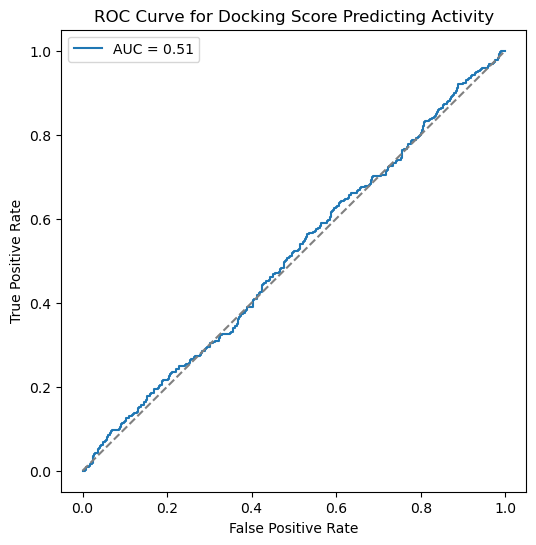

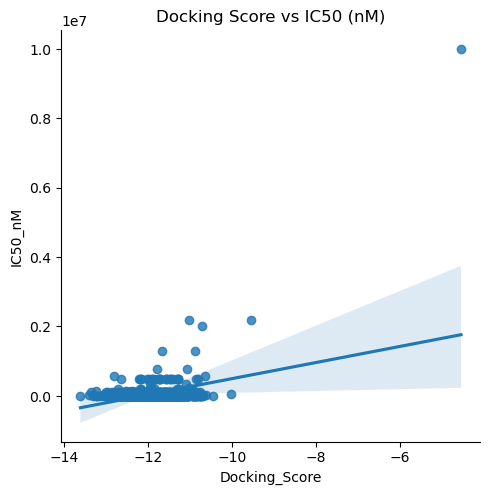

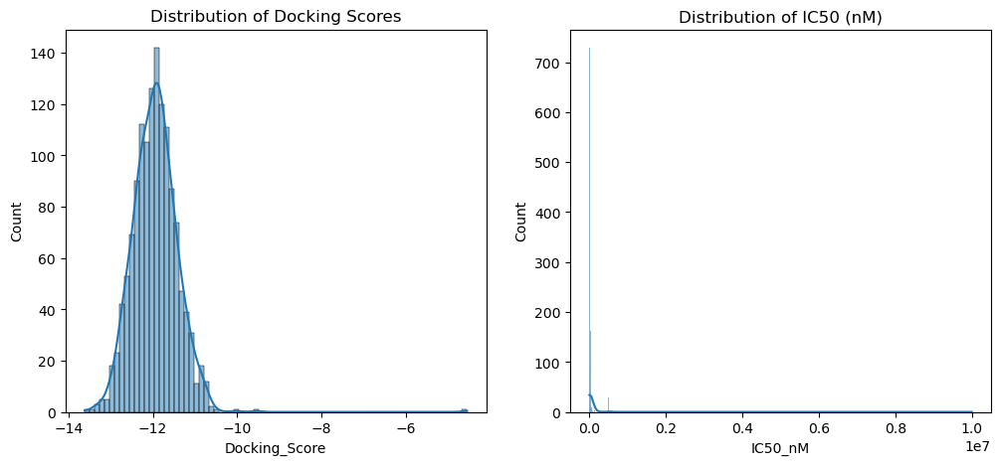

In [59]:
# LDHA Docking Analysis: Correlation and Predictive Metrics

# Import libraries
import pandas as pd
import numpy as np
from scipy.stats import pearsonr, spearmanr, kendalltau
from sklearn.metrics import mean_squared_error, mean_absolute_error, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
# Replace with your actual CSV file or DataFrame
df = pd.read_csv('cleaned_merged_dataset.csv')

# Check the first few rows
df.head()

# Clean data (drop missing)
df = df.dropna(subset=['Docking_Score', 'IC50_nM'])

# Calculate metrics

# Pearson correlation
pearson_corr, pearson_pval = pearsonr(df['Docking_Score'], df['IC50_nM'])

# Spearman correlation
spearman_corr, spearman_pval = spearmanr(df['Docking_Score'], df['IC50_nM'])

# Kendall’s Tau
kendall_corr, kendall_pval = kendalltau(df['Docking_Score'], df['IC50_nM'])

# Coefficient of determination R²
r_squared = pearson_corr ** 2

# RMSE and MAE
rmse = np.sqrt(mean_squared_error(df['IC50_nM'], df['Docking_Score']))
mae = mean_absolute_error(df['IC50_nM'], df['Docking_Score'])

# Print summary
print(f"Pearson r: {pearson_corr:.3f} (p = {pearson_pval:.3e})")
print(f"Spearman ρ: {spearman_corr:.3f} (p = {spearman_pval:.3e})")
print(f"Kendall’s τ: {kendall_corr:.3f} (p = {kendall_pval:.3e})")
print(f"R²: {r_squared:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")

# Optional ➡ Binarize IC50 for active/inactive classification
df['Active'] = df['IC50_nM'] < 500  # Threshold: IC50 < 500 nM = active
docking_scores_scaled = -df['Docking_Score']  # More negative = stronger

# Calculate AUC
auc = roc_auc_score(df['Active'], docking_scores_scaled)
print(f"AUC: {auc:.3f}")

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(df['Active'], docking_scores_scaled)
plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
plt.plot([0,1], [0,1], '--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Docking Score Predicting Activity')
plt.legend()
plt.show()

# Plot scatter with regression line
sns.lmplot(x='Docking_Score', y='IC50_nM', data=df)
plt.title('Docking Score vs IC50 (nM)')
plt.show()

# Plot distributions
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['Docking_Score'], kde=True)
plt.title('Distribution of Docking Scores')

plt.subplot(1,2,2)
sns.histplot(df['IC50_nM'], kde=True)
plt.title('Distribution of IC50 (nM)')
plt.show()

In [61]:
# Import libraries
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import Descriptors, rdMolDescriptors, AllChem
from rdkit.Chem import PandasTools
import warnings
from rdkit import RDLogger
# Suppress RDKit deprecation warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
# Suppress RDKit logs
RDLogger.DisableLog('rdApp.*')


# Load data
df = pd.read_csv('cleaned_merged_dataset.csv')  # should have 'Ligand_SMILES', 'Docking_Score', 'IC50_nM'
print(df.head())

# Convert SMILES to RDKit molecules
df['Mol'] = df['Ligand_SMILES'].apply(Chem.MolFromSmiles)

# Add molecular descriptors
def calc_descriptors(mol):
    return pd.Series({
        'MolWt': Descriptors.MolWt(mol),
        'LogP': Descriptors.MolLogP(mol),
        'TPSA': Descriptors.TPSA(mol),
        'NumHDonors': Descriptors.NumHDonors(mol),
        'NumHAcceptors': Descriptors.NumHAcceptors(mol),
        'NumRotatableBonds': Descriptors.NumRotatableBonds(mol),
        'NumAromaticRings': rdMolDescriptors.CalcNumAromaticRings(mol)
    })

descriptor_df = df['Mol'].apply(calc_descriptors)
df = pd.concat([df, descriptor_df], axis=1)

# Add Morgan fingerprints (ECFP4)
def mol_to_ecfp4(mol, n_bits=2048):
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=n_bits)
    arr = np.zeros((1,), dtype=int)
    Chem.DataStructs.ConvertToNumpyArray(fp, arr)
    return arr

fp_array = np.array([mol_to_ecfp4(mol) for mol in df['Mol']])
fp_df = pd.DataFrame(fp_array, columns=[f'FP_{i}' for i in range(fp_array.shape[1])])
df = pd.concat([df, fp_df], axis=1)

# Final dataset check
print(f"Final dataset shape: {df.shape}")
print(df[['Docking_Score', 'IC50_nM', 'MolWt', 'LogP', 'TPSA', 'NumHDonors', 'NumHAcceptors']].head())

# Save engineered dataset
df.drop(columns=['Mol'], inplace=True)
df.to_csv('engineered_dataset.csv', index=False)
print("Saved engineered dataset to 'engineered_dataset.csv'")

                                       Ligand_SMILES  IC50_nM  Class  \
0  C#CCCCC(=O)Nc1ccc(C(=O)c2ccc(NCc3ccc(-c4ccc(O)...    500.0      1   
1  C#CCN(Cc1ccc(-c2ccc(O)c(C(=O)O)c2)o1)Cc1ccc(-c...   1600.0      0   
2              C#CCNCc1ccc(-c2ccc(O)c(C(=O)O)c2)o1.N   2000.0      0   
3  C#Cc1cc(-c2nn(-c3nc(C(=O)O)cs3)c(CC3CC3)c2Cc2c...    456.0      1   
4  C/C=C/c1cc(-c2nn(-c3nc(C(=O)O)cs3)c(CC3CC3)c2C...    215.8      1   

  Compound_ID  Docking_Score  
0    CMPD_000     -11.751243  
1    CMPD_001     -12.067852  
2    CMPD_002     -11.674556  
3    CMPD_003     -11.238120  
4    CMPD_004     -12.116904  
Final dataset shape: (1351, 2061)
   Docking_Score  IC50_nM    MolWt    LogP    TPSA  NumHDonors  NumHAcceptors
0     -11.751243    500.0  539.588  6.0975  163.87         5.0            7.0
1     -12.067852   1600.0  521.526  4.9736  214.58         6.0            9.0
2     -11.674556   2000.0  288.303  2.2352  117.70         4.0            5.0
3     -11.238120    456.0  554.600 

In [63]:
# Import libraries
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import Descriptors, rdMolDescriptors, AllChem
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, roc_auc_score
import warnings
from rdkit import RDLogger
# Suppress RDKit deprecation warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
# Suppress RDKit logs
RDLogger.DisableLog('rdApp.*')

# Load data
df = pd.read_csv('cleaned_merged_dataset.csv')  # needs 'Ligand_SMILES', 'Docking_Score', 'IC50_nM'

# Convert SMILES to RDKit molecules
df['Mol'] = df['Ligand_SMILES'].apply(Chem.MolFromSmiles)

# Add molecular descriptors
def calc_descriptors(mol):
    return pd.Series({
        'MolWt': Descriptors.MolWt(mol),
        'LogP': Descriptors.MolLogP(mol),
        'TPSA': Descriptors.TPSA(mol),
        'NumHDonors': Descriptors.NumHDonors(mol),
        'NumHAcceptors': Descriptors.NumHAcceptors(mol),
        'NumRotatableBonds': Descriptors.NumRotatableBonds(mol),
        'NumAromaticRings': rdMolDescriptors.CalcNumAromaticRings(mol)
    })

descriptor_df = df['Mol'].apply(calc_descriptors)
df = pd.concat([df, descriptor_df], axis=1)

# Add Morgan fingerprints (ECFP4)
def mol_to_ecfp4(mol, n_bits=2048):
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=n_bits)
    arr = np.zeros((1,), dtype=int)
    Chem.DataStructs.ConvertToNumpyArray(fp, arr)
    return arr

fp_array = np.array([mol_to_ecfp4(mol) for mol in df['Mol']])
fp_df = pd.DataFrame(fp_array, columns=[f'FP_{i}' for i in range(fp_array.shape[1])])
df = pd.concat([df, fp_df], axis=1)

# Prepare data for ML
df['Active'] = df['IC50_nM'] < 500  # classify active compounds
features = df.drop(columns=['Compound_ID', 'Ligand_SMILES', 'Mol', 'IC50_nM', 'Active'])
target_regression = df['IC50_nM']
target_classification = df['Active']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(features, target_regression, test_size=0.2, random_state=42)

# Random Forest Regression
regressor = RandomForestRegressor(n_estimators=100, random_state=42)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

# Evaluate regression
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Regression RMSE: {rmse:.3f}")
print(f"Regression MAE: {mae:.3f}")
print(f"Regression R²: {r2:.3f}")

# Random Forest Classification
clf = RandomForestClassifier(n_estimators=100, random_state=42)
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(features, target_classification, test_size=0.2, random_state=42)
clf.fit(X_train_c, y_train_c)
y_pred_prob = clf.predict_proba(X_test_c)[:, 1]

# Evaluate classification
auc = roc_auc_score(y_test_c, y_pred_prob)
print(f"Classification AUC: {auc:.3f}")

# Cross-validation (optional, for robustness)
cv_r2 = cross_val_score(regressor, features, target_regression, cv=5, scoring='r2')
cv_auc = cross_val_score(clf, features, target_classification, cv=5, scoring='roc_auc')
print(f"Cross-validated R² (regression): {cv_r2.mean():.3f}")
print(f"Cross-validated AUC (classification): {cv_auc.mean():.3f}")

# Save engineered dataset
df.drop(columns=['Mol'], inplace=True)
df.to_csv('engineered_dataset.csv', index=False)
print("Saved engineered dataset to 'engineered_dataset.csv'")

Regression RMSE: 57695.677
Regression MAE: 18433.290
Regression R²: 0.558
Classification AUC: 0.975
Cross-validated R² (regression): -0.701
Cross-validated AUC (classification): 0.909
Saved engineered dataset to 'engineered_dataset.csv'


# Summary:
**• Predicting exact potency (IC50) is still hard, and the model’s predictions have big errors.\
• Classifying active vs. inactive compounds works very well: the model is nearly perfect at this.\
• Regression needs improvement, probably with more data or more advanced modeling.\
• Classification is already ready for practical use.**
